# Explore the User Habbits for Shared Bike in San Francisco

## Investigation Overview

In this investigation, I want to explore the user habbit using the shared bike data in San Francisco during Feb 2019. 

## Dataset Overview

The data consists of 183,412 bike ride records with 17 features (duration, start/end date/time, start/end station and their id; start/end station's location, bike id, subscription type, user birth year and user gender). Most variables are categorical and are recorded in numeric datatype. The data consists on records in Feb 2019 in the city of San Francisco. There are missing data in all categories, but mostly in users' personal information.

In [1]:
%%capture
# install folum package
! pip install pandas folium;

In [2]:
# import all packages and set plots to be embedded inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb

%matplotlib inline


import folium
from folium import plugins
from folium.plugins import HeatMap

# suppress warnings from final output
import warnings
warnings.simplefilter("ignore")

In [3]:
# load in the dataset into a pandas dataframe
bike = pd.read_csv('fordgobike-tripdata.csv')

In [4]:
# converting start and end time to datetime datatype
bike['start_time'] = pd.to_datetime(bike['start_time'])
bike['end_time'] = pd.to_datetime(bike['end_time'])

In [5]:
# add column for start/end date/time and trip start hour
bike['start_date'] = pd.to_datetime(bike['start_time']).dt.date
bike['start_time'] = pd.to_datetime(bike['start_time']).dt.time
bike['end_date'] = pd.to_datetime(bike['end_time']).dt.date
bike['end_time'] = pd.to_datetime(bike['end_time']).dt.time
bike['start_hour'] = bike.start_time.astype(str).str[:2]

## Distribution of Trip Durations

The duration has a long-tailed distribution with only 1.5% of the rides lasts longer than 2700 sec (45min), which is the rental limit for subscribers (30min for non-subscribers). Most of the trip durations are around 500 sec (8min), seems like a good amount of time for commute or running errands. 

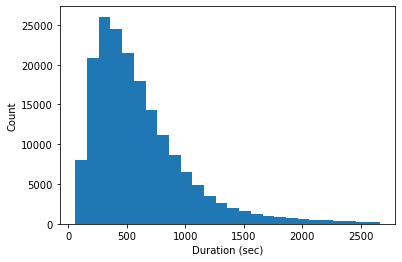

In [6]:
# limit the x-axis to 0-2700
bin_edges = np.arange(60, 2700, 100)
sb.distplot(bike['duration_sec'], bins = bin_edges, kde = False,
            hist_kws = {'alpha' : 1})
plt.xlabel('Duration (sec)')
plt.ylabel('Count')
plt.show()

## Trip Start Time Distribution

The graph of rental start time suggests that most of the trips are started 8:00 and 17:00, which are the time for most of people go to work.

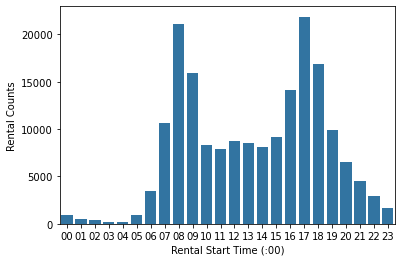

In [7]:
base_color = sb.color_palette()[0]
sb.countplot(data=bike, x='start_hour', color=base_color);
plt.xlabel('Rental Start Time (:00)')
plt.ylabel('Rental Counts')
plt.show()

## User Type vs. Durations

We have data for 163.5k subscriber and 19.9k non-subscribers. Most users ride 12-13min despite s/he is a subscriber or not. Surprisingly, subscribers on average took a shorter ride than non-subscribers.

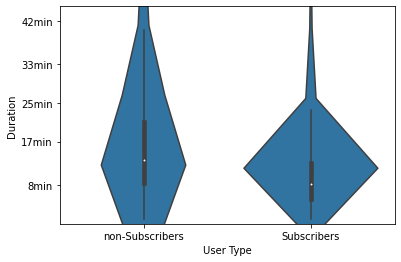

In [8]:
ax2=sb.violinplot(data=bike, x='user_type', y='duration_sec', color=base_color);
ax2.set(ylim=(0, 2700), yticks = [480, 1020, 1500, 1980, 2520], yticklabels= ['8min', '17min', '25min', '33min', '42min'], xticklabels = ['non-Subscribers','Subscribers'])
ax2.set(ylabel='Duration', xlabel='User Type')
plt.show()

## Geographic feature of the Stations

Next I dig in to the geographic data using the longitude and latitude data. San Francisco's shared bike system has three centers - San Francisco downtown, Oakland, and Silicon Valley (plus San Jose). The top 10 popular stations are all from San Francisco downtown area. 

In [9]:
# plot the start station location on the map
m=folium.Map([37.550108, -122.265746], zoom_start=10)
hm_wide = HeatMap(
    list(zip(bike.start_station_latitude.values, bike.start_station_longitude.values)),
    min_opacity=0.2,
    radius=5, 
    blur=5, 
    max_zoom=1,
)

# plot heatmap
m.add_child(hm_wide)
m

In [12]:
# explore top 10 start location and duration
# extract the top 10 popular start stations' name (by count) and pull the related data from orginal dataframe
start_10=bike.start_station_name.value_counts().index.tolist()
start_10=start_10[0 : 10] 
bike_10 = bike.loc[bike['start_station_name'].isin(start_10)]

# where are the most popular stations located 
m2=folium.Map([37.741990, -122.422640], zoom_start=12)
hm_wide = HeatMap(
    list(zip(bike_10.start_station_latitude.values, bike_10.start_station_longitude.values)),
    min_opacity=0.2,
    radius=13, 
    blur=10, 
    max_zoom=1,
)

# plot heatmap
m2.add_child(hm_wide)
m2

## Trip Duration Distribution for the Top 10 Popular Stations

After zooming in to see the duration of 0-45 min and 0-30 min, I observed that trips starting from the 10 stations mostly last 6-15 min with the average trip duration of around 10mins. Trips starts from San Francisco Ferry Building Station seems to have longer duration time than other popular. From the most popular 10 stations, most of the trips' (80%, duration ranges 6-15 mins) ending stations spread out in the the San Francisco downtown area. On a further investigation of the rental start time, most of the trips happened on 8:00 and 17:00, similar to the commute time.

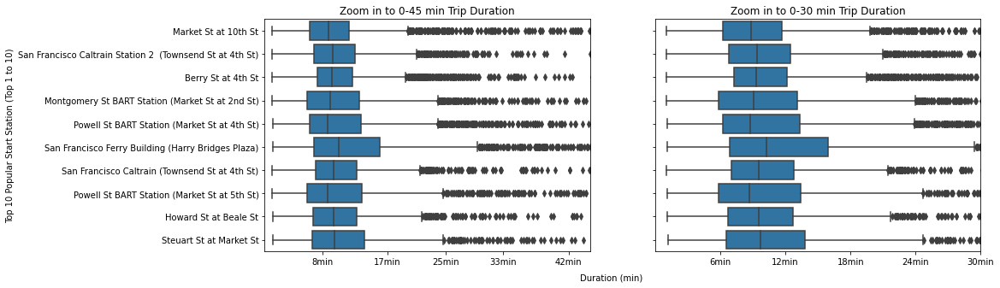

In [13]:
# the duration has a long tail, explore the duration time below 45 min (2700 sec) and below 30 min (1800 sec)

fig = plt.figure(figsize = [15, 5])
base_color = sb.color_palette()[0]

plt.subplot(1,2,1)
ax1=sb.boxplot(data=bike_10, y='start_station_name', x='duration_sec', color=base_color, order=start_10)
ax1.set(xlim=(0, 2700), xticks = [480, 1020, 1500, 1980, 2520], xticklabels= ['8min', '17min', '25min', '33min', '42min'], 
        ylabel = 'Top 10 Popular Start Station (Top 1 to 10)', title = 'Zoom in to 0-45 min Trip Duration', xlabel = None)

plt.subplot(1,2,2)
ax2=sb.boxplot(data=bike_10, y='start_station_name', x='duration_sec', color=base_color, order=start_10)
ax2.set(xlim=(0, 1800), xticks = [360, 720, 1080, 1440, 1800], xticklabels= ['6min', '12min', '18min', '24min', '30min'], 
        yticklabels = [], ylabel=None, title = 'Zoom in to 0-30 min Trip Duration', xlabel=None)

fig.text(0.5, 0.04, 'Duration (min)', ha='center', va='center')

plt.show()

In [14]:
# Further investigate the trip durations within 6-15 min (180-900 sec)
bike_10_615 = bike_10.loc[(bike_10['duration_sec'] > 179 ) & (bike_10['duration_sec'] < 901)]

# where does most trip ends from the most popular 10 start station 
m3=folium.Map([37.741990, -122.422640], zoom_start=12)
hm_wide = HeatMap(
    list(zip(bike_10_615.end_station_latitude.values, bike_10_615.end_station_longitude.values)),
    min_opacity=0.2,
    radius=13, 
    blur=10, 
    max_zoom=1,
)

# plot heatmap
m3.add_child(hm_wide)
m3

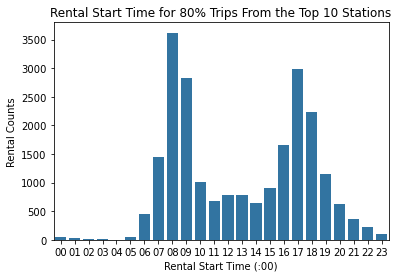

In [15]:
# Take a look at when does these trip usually happens
sb.countplot(data=bike_10_615, x='start_hour', color=base_color)
plt.xlabel('Rental Start Time (:00)')
plt.ylabel('Rental Counts')
plt.title('Rental Start Time for 80% Trips From the Top 10 Stations')
plt.show()

## Trip Start Times Distribution in the Top 10 Start Station

Despite that the entire sample set suggests that the top 10 stations are in particular popular among usual commute time, namely 8:00 and 17:00, each station is different. Market St & 10th St is popular during daytime, suggesting that the station might be located at a popular tourism site or among office buildings; Caltrain Stations (& 2) are mostly popular at 5:00 and 14:00, maybe due to people commuting in the form of both train and bike. 

12:00, 13:00 and 14:00 are popular time when people unlock the bikes, which trips could be used to go to lunches. 

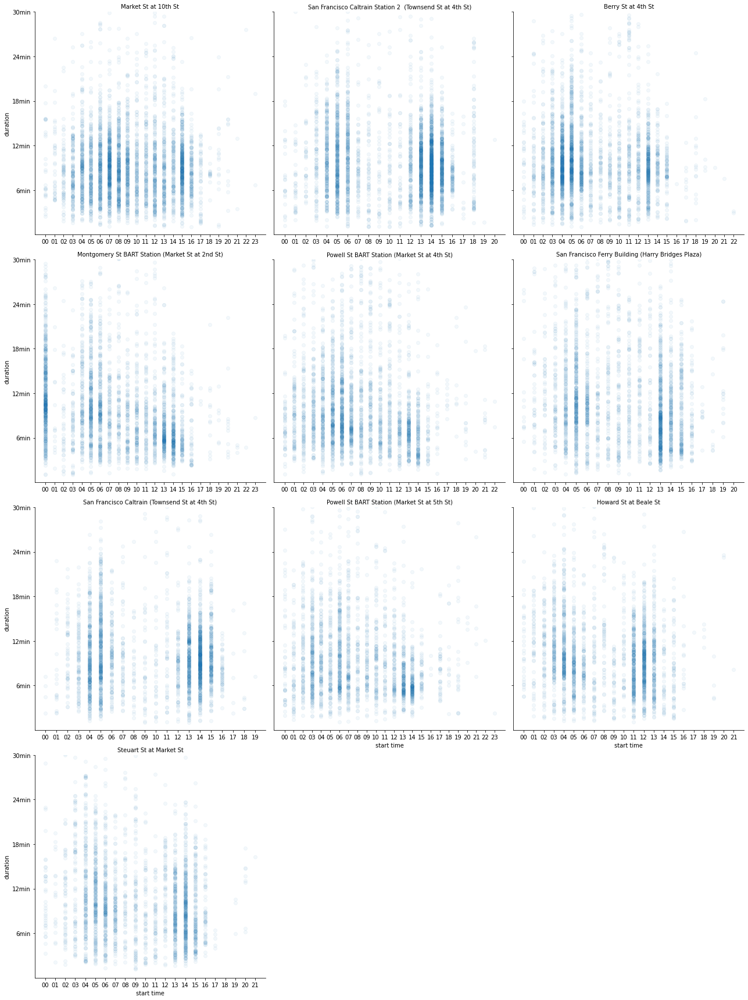

In [16]:
time=bike_10['start_hour'].sort_values().drop_duplicates().to_list()

# explore relationship among time, duration, and the top 10 start stations
g = sb.FacetGrid(data = bike_10, col = 'start_station_name', height = 6, col_wrap=3, col_order = start_10, sharex=False)
g.map(plt.scatter, 'start_hour', 'duration_sec', alpha=1/20)
g.set(ylim=(0, 1800), yticks = [360, 720, 1080, 1440, 1800], yticklabels= ['6min', '12min', '18min', '24min', '30min'], xticklabels=time)
g.set_axis_labels("start time", "duration")
plt.setp(g.fig.texts, text="")
g.set_titles(row_template="{row_name}", col_template="{col_name}")
plt.show()